In [2]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

from hloc import extract_features, match_features, reconstruction, visualization

## Setup
In this notebook, we will run SfM reconstruction from scratch on a set of images. We choose the [South-Building dataset](https://openaccess.thecvf.com/content_cvpr_2013/html/Hane_Joint_3D_Scene_2013_CVPR_paper.html) - we will download it later. First, we define some paths.

In [3]:
dataset = Path('/home/cloudlet/datasets/argoverse-tracking/')
images = dataset / 'images/'

outputs = Path('outputs/argo/')
sfm_pairs = outputs / 'pairs-exhaustive.txt'  # exhaustive matching
sfm_dir = outputs / 'sfm_superpoint+superglue'

feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']

features = feature_conf['output']
feature_file = f"{features}.h5"
match_file = f"{features}_{matcher_conf['output']}_{sfm_pairs.stem}.h5"

## Download the dataset
The dataset is simply a set of images. The intrinsic parameters will be extracted from the EXIF data, and refined with SfM.

In [3]:
# %%bash -s "$dataset"
# wget http://cvg.ethz.ch/research/local-feature-evaluation/South-Building.zip -P $1
# unzip datasets/sfm_South-Building/South-Building.zip -d $1

## Extract local features

In [4]:
extract_features.main(feature_conf, images, outputs)

[09/09/2020 13:10:44 INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}
Loaded SuperPoint model
[09/09/2020 13:10:52 INFO] Found 469 images in root /home/cloudlet/datasets/argoverse-tracking/images.


  0%|          | 0/469 [00:00<?, ?it/s]/home/cloudlet/work/Hierarchical-Localization/hloc/extractors/../../third_party/SuperGluePretrainedNetwork/models/superpoint.py:172: UserWarning: This overload of nonzero is deprecated:
	nonzero(Tensor input, *, Tensor out)
Consider using one of the following signatures instead:
	nonzero(Tensor input, *, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  for s in scores]
100%|██████████| 469/469 [00:16<00:00, 28.38it/s]

[09/09/2020 13:11:08 INFO] Finished exporting features.


## Exhaustive matching
Since the dataset is small, we can match all $\frac{n(n-1)}{2}$ images pairs. To do so, we pass the argument `exhaustive=True` and make sure that the pair file does not exist yet. If your dataset is larger, exhaustive matching might take a long time - consider selecting fewer pairs using image retrieval and `hloc/pairs_from_retrieval.py`.

In [5]:
match_features.main(matcher_conf, sfm_pairs, features, outputs, exhaustive=True)

[09/09/2020 13:11:17 INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}
[09/09/2020 13:11:17 INFO] Writing exhaustive match pairs to outputs/argo/pairs-exhaustive.txt.
cuda
Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 109746/109746 [4:08:17<00:00,  7.37it/s] 

[09/09/2020 17:19:36 INFO] Finished exporting matches.


## SfM reconstruction
Run COLMAP on the features and matches.

In [4]:
reconstruction.main(
    sfm_dir,
    images,
    sfm_pairs,
    outputs / feature_file,
    outputs / match_file)

[09/12/2020 00:28:22 INFO] Creating an empty database...
[09/12/2020 00:28:22 INFO] Importing images into the database...
{'ring_front_center_315978406032859416.jpg': 1, 'ring_front_center_315978406066159560.jpg': 2, 'ring_front_center_315978406099459768.jpg': 3, 'ring_front_center_315978406132759976.jpg': 4, 'ring_front_center_315978406166060120.jpg': 5, 'ring_front_center_315978406199360328.jpg': 6, 'ring_front_center_315978406232660536.jpg': 7, 'ring_front_center_315978406265960680.jpg': 8, 'ring_front_center_315978406299260888.jpg': 9, 'ring_front_center_315978406332560648.jpg': 10, 'ring_front_center_315978406365860408.jpg': 11, 'ring_front_center_315978406399160168.jpg': 12, 'ring_front_center_315978406432459928.jpg': 13, 'ring_front_center_315978406465759688.jpg': 14, 'ring_front_center_315978406499059448.jpg': 15, 'ring_front_center_315978406532359208.jpg': 16, 'ring_front_center_315978406565658968.jpg': 17, 'ring_front_center_315978406598958728.jpg': 18, 'ring_front_center_315

100%|██████████| 469/469 [00:00<00:00, 2904.71it/s]


[09/12/2020 00:28:29 INFO] Importing matches into the database...


  0%|          | 0/109746 [00:00<?, ?it/s]

~~ <class 'dict'>
ring_front_center_315978421550657352.jpg
ring_front_center_315978420618257592.jpg


  0%|          | 0/109746 [00:00<?, ?it/s]


IntegrityError: UNIQUE constraint failed: matches.pair_id

## Visualization
We visualize some of the registered images, and color their keypoint by visibility, track length, or triangulated depth.

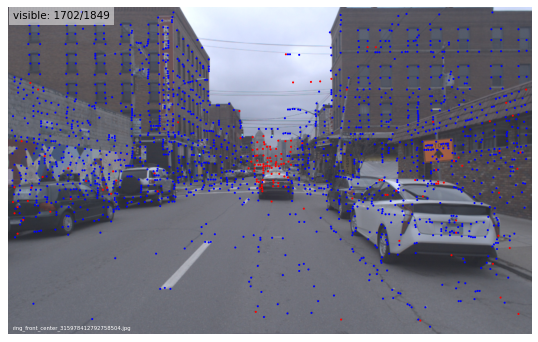

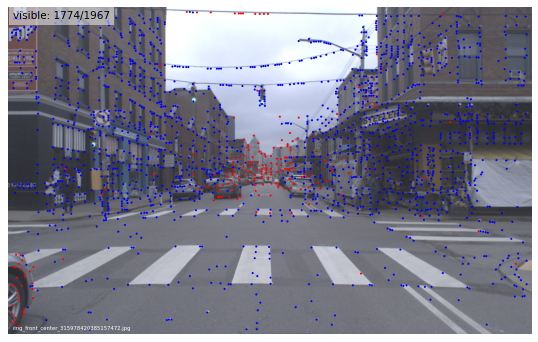

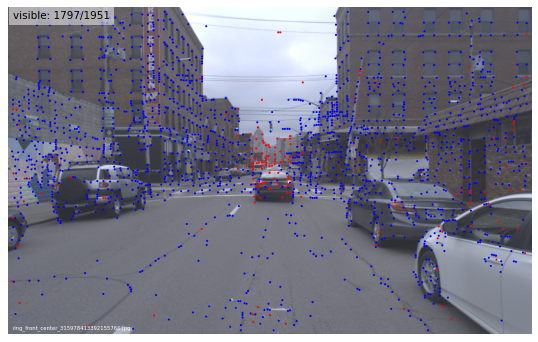

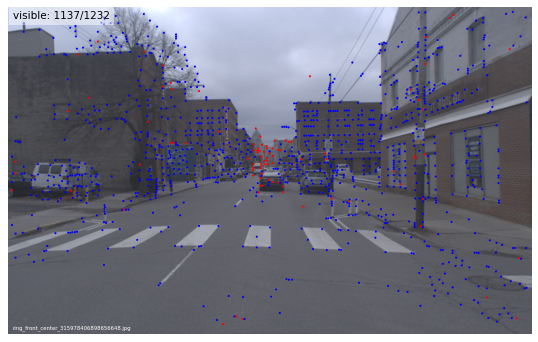

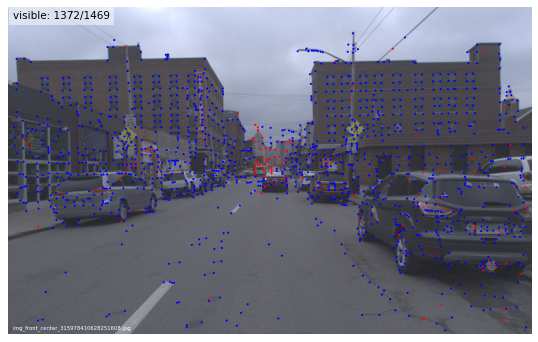

...

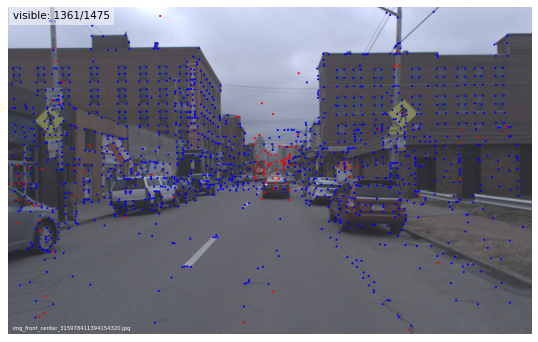

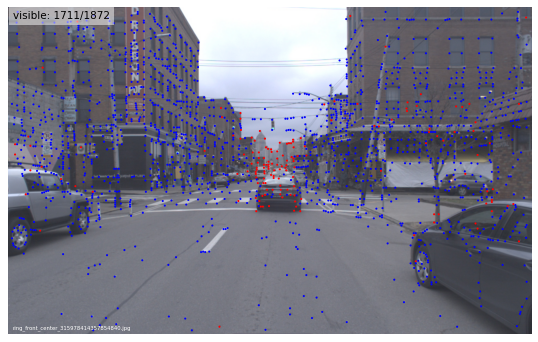

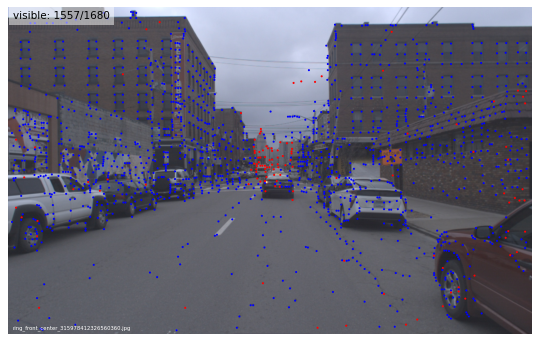

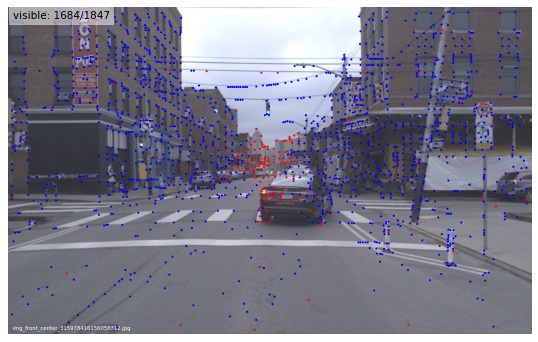

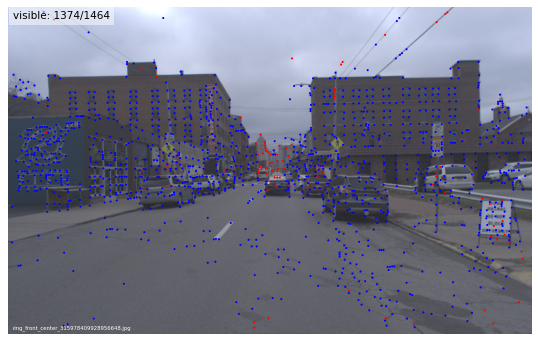

In [13]:
visualization.visualize_sfm_2d(sfm_dir / 'models/2', images, color_by='visibility', n=15)

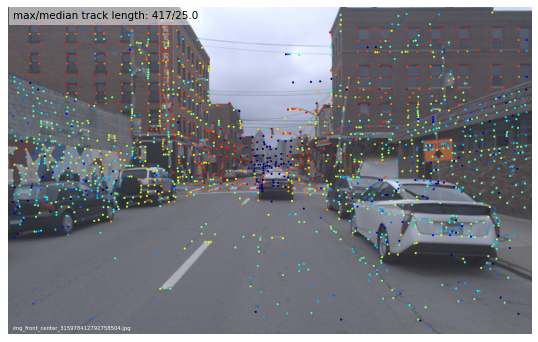

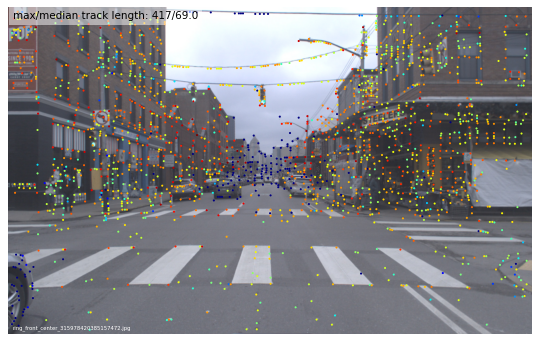

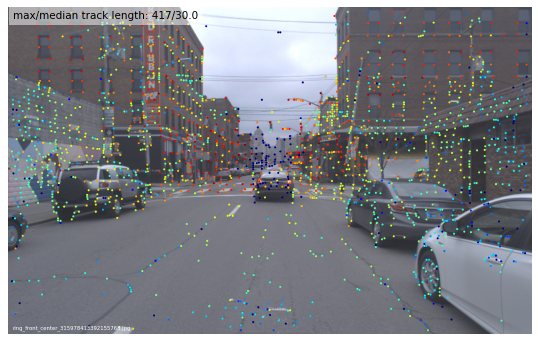

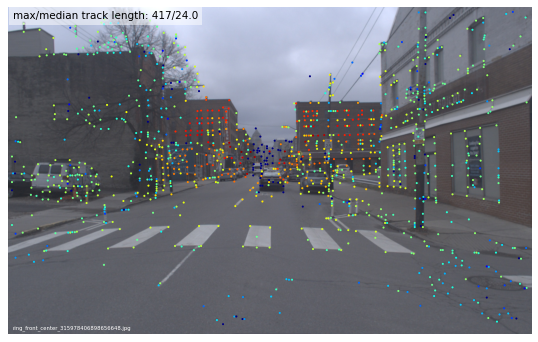

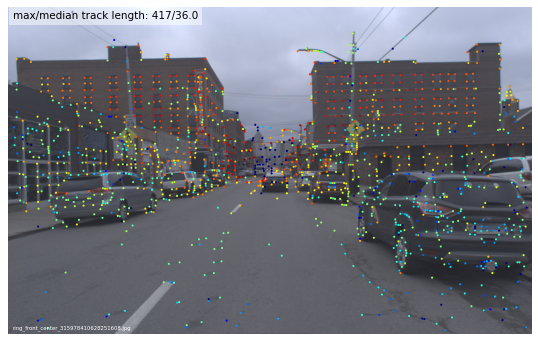

...

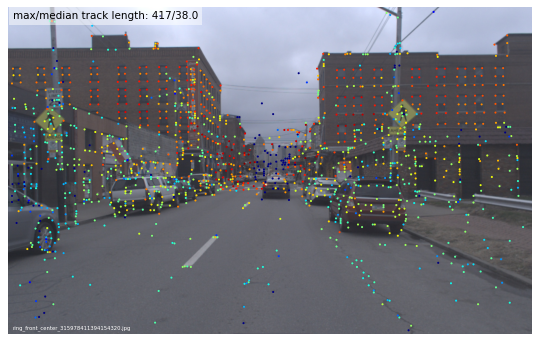

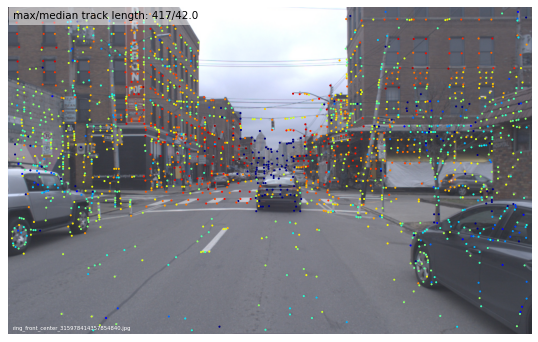

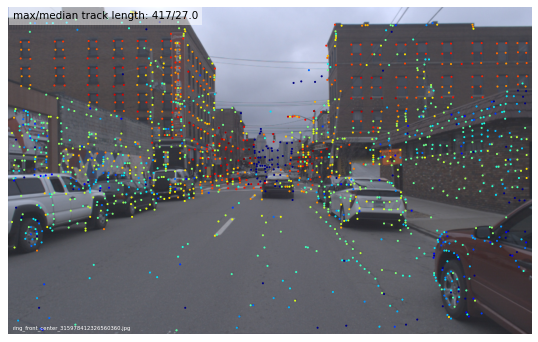

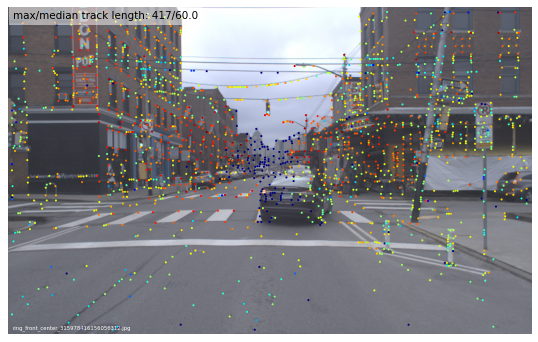

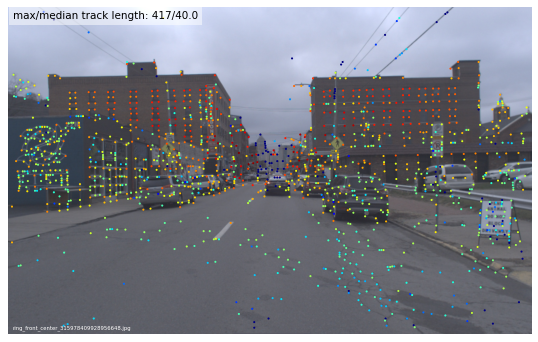

In [4]:
visualization.visualize_sfm_2d(sfm_dir / 'models/2', images, color_by='track_length', n=15)

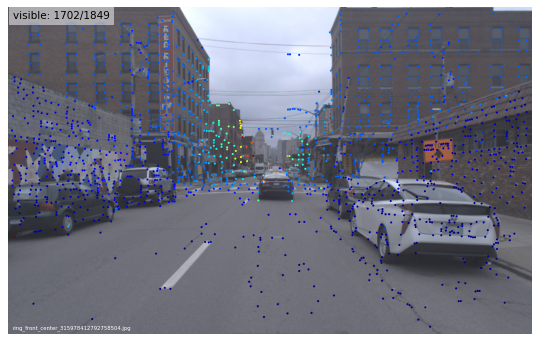

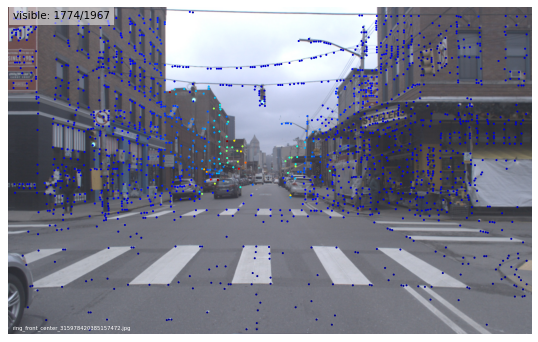

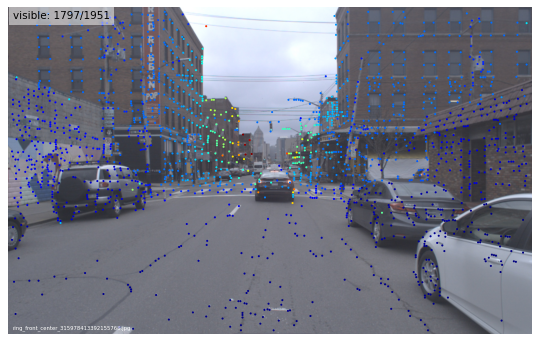

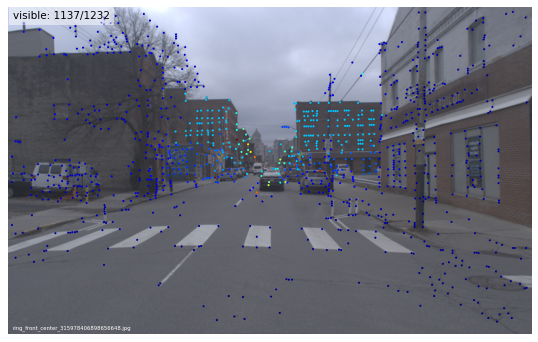

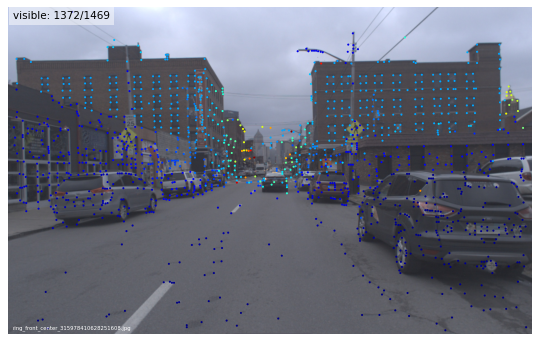

...

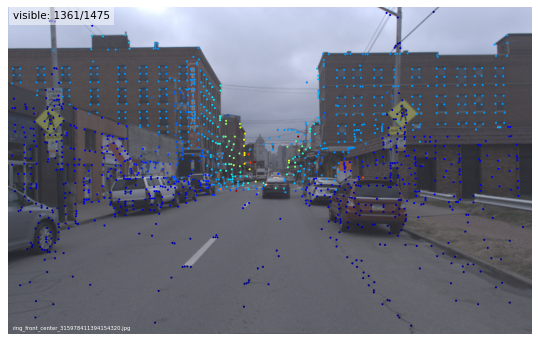

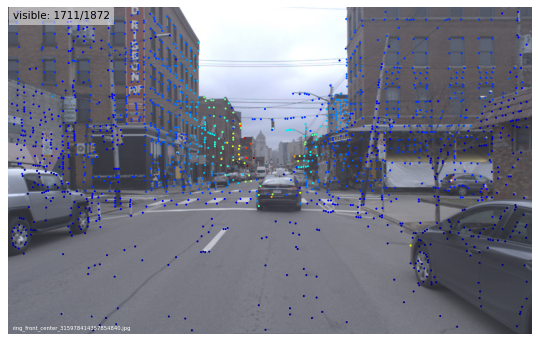

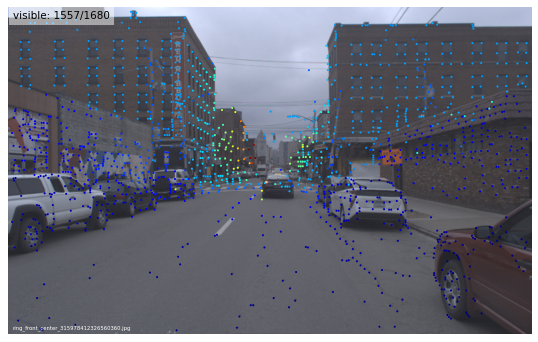

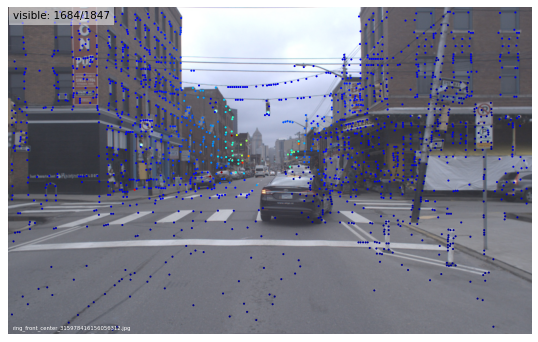

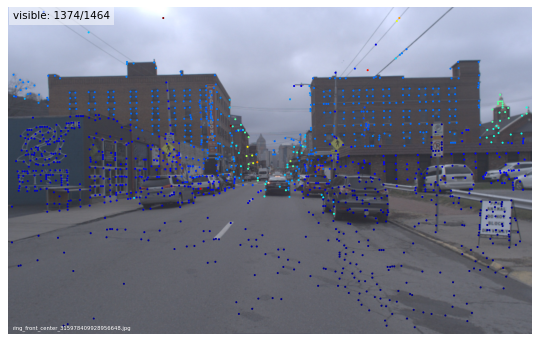

In [5]:
visualization.visualize_sfm_2d(sfm_dir / 'models/2', images, color_by='depth', n=15)